<a href="https://colab.research.google.com/github/nitinog10/Vechile-detection-and-object-detection-model/blob/main/Real_Time_Traffic_Density_Estimation_with_YOLOv8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
farzadnekouei_top_view_vehicle_detection_image_dataset_path = kagglehub.dataset_download('farzadnekouei/top-view-vehicle-detection-image-dataset')

print('Data source import complete.')


Using Colab cache for faster access to the 'top-view-vehicle-detection-image-dataset' dataset.
Data source import complete.


<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <h1 style="font-size:24px; font-family:calibri; color:#141140;"><b>🚀 YOLO: The Real-Time Object Detection Revolution</b></h1>
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        <strong>YOLO</strong>, short for "<strong>You Only Look Once</strong>", revolutionizes object detection in computer vision by offering a fast and streamlined approach. It uniquely simplifies the detection process, treating it as a single-step task that combines object localization and classification. This innovative method allows YOLO to process images and videos in real-time with high accuracy. The latest version, <strong>YOLOv8</strong>, further enhances this technology, adeptly tackling challenges in object detection and image segmentation. YOLO's real-time capabilities make it a standout choice for applications needing rapid and precise object identification.
    </p>
</div>

<h2 align="left"><font color=#141140>Let's get started:</font></h2>

<a id="Initialization"></a>
# <p style="background-color: #141140; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Step 1 | Setup and Initialization</p>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">YOLOv8 is the first version of the YOLO series to offer an official package that can be easily installed using pip. This streamlines the setup process, a notable advancement from previous versions that required cloning repositories and running scripts. Let's begin by installing the Ultralytics package:</p>
</div>

In [4]:
# Install Ultralytics library
!pip install ultralytics

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">Then, let's import all the essential libraries needed for our project:</p>
</div>

In [5]:
# Disable warnings in the notebook to maintain clean output cells
import warnings
warnings.filterwarnings('ignore')

# Import necessary libraries
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import yaml
from PIL import Image
from ultralytics import YOLO
from IPython.display import Video

In [6]:
# Configure the visual appearance of Seaborn plots
sns.set(rc={'axes.facecolor': '#eae8fa'}, style='darkgrid')

<a id="Load_Model"></a>
# <p style="background-color: #141140; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Step 2 | Loading YOLOv8 Pre-trained Model</p>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">Here are the pre-trained YOLOv8 object detection models, which have been trained on the <strong>COCO dataset</strong>. The Common Objects in Context (COCO) dataset is extensive, designed for object detection, segmentation, and captioning, and encompasses <a href="https://github.com/ultralytics/ultralytics/blob/main/ultralytics/cfg/datasets/coco.yaml">80 diverse object categories</a>:</p>
</div>

<img src="https://github.com/FarzadNekouee/YOLOv8_Traffic_Density_Estimation/blob/master/images/YOLOv8_object_detection_models.jpg?raw=true" width="2400">

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <h1 style="font-size:24px; font-family:calibri; color:#141140;"><b>📈 Model Performance Trade-offs</b></h1>
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        The YOLOv8 suite presents five distinct models: <strong>nano</strong>, <strong>small</strong>, <strong>medium</strong>, <strong>large</strong>, and <strong>xlarge</strong>. A clear trend emerges from the data: as model size increases, there's a notable improvement in <strong>mAP</strong>, indicating enhanced accuracy. Conversely, this augmentation comes at the cost of speed, with larger models being slower. All models adhere to a standard input size of <strong>640x640</strong> pixels, optimizing performance across diverse applications.
    </p>
</div>

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">For our real-time traffic density estimation application, I am going to select the <strong>YOLOv8 nano pre-trained model (yolov8n.pt)</strong> to handle vehicle detection. This model ensures the fastest possible inference time, making it well-suited for real-time use:</p>
</div>

In [7]:
# Load a pretrained YOLOv8n model from Ultralytics
model = YOLO('yolov8n.pt')

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">The pre-trained model we've loaded is trained on the COCO dataset, which includes the 'car' and 'truck' classes among its 80 different categories — exactly what we need for our project. Now, let's put our model to the test and see how it performs on a sample image:</p>
</div>


image 1/1 /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/sample_image.jpg: 384x640 5 cars, 485.3ms
Speed: 18.1ms preprocess, 485.3ms inference, 3.3ms postprocess per image at shape (1, 3, 384, 640)


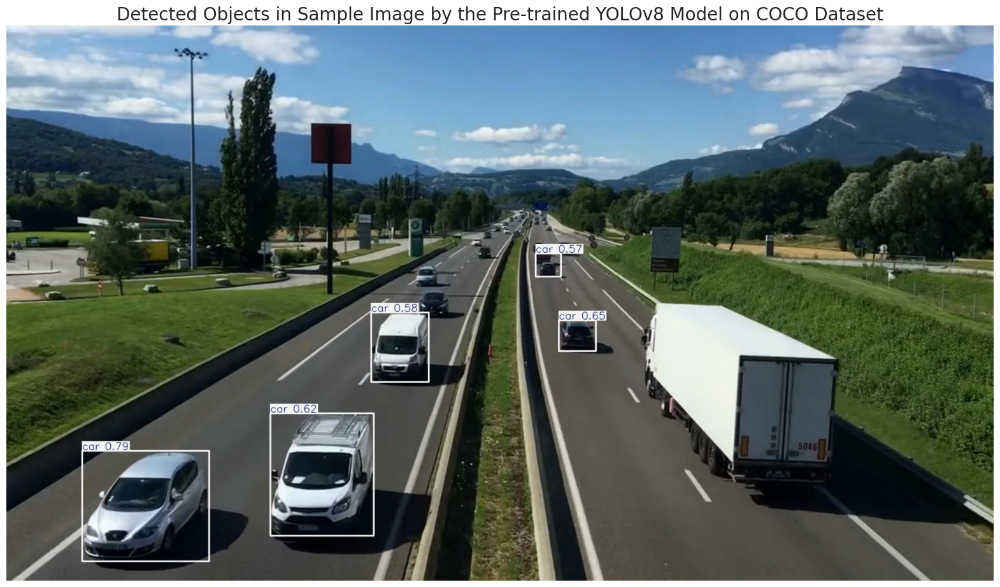

In [8]:
import os

# Path to the image file
# Corrected path using the downloaded dataset path
image_path = os.path.join(farzadnekouei_top_view_vehicle_detection_image_dataset_path, 'Vehicle_Detection_Image_Dataset', 'sample_image.jpg')

# Perform inference on the provided image(s)
results = model.predict(source=image_path,
                        imgsz=640,  # Resize image to 640x640 (the size pf images the model was trained on)
                        conf=0.5)   # Confidence threshold: 50% (only detections above 50% confidence will be considered)

# Annotate and convert image to numpy array
sample_image = results[0].plot(line_width=2)

# Convert the color of the image from BGR to RGB for correct color representation in matplotlib
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

# Display annotated image
plt.figure(figsize=(20,15))
plt.imshow(sample_image)
plt.title('Detected Objects in Sample Image by the Pre-trained YOLOv8 Model on COCO Dataset', fontsize=20)
plt.axis('off')
plt.show()

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <h2 style="font-size:22px; font-family:calibri; color:#141140;"><b>🔍 Pre-trained Model Detection Analysis</b></h2>
    <p style="font-size:18px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        In our sample image, the pre-trained model missed the detectable truck and car that were clearly visible. A model pre-trained on a dataset with a broad range of classes, like COCO's 80 different categories, may not perform as well on a specific subset of those categories due to the diversity of objects it has been trained to recognize. If we fine-tune this model on a specialized dataset that focuses solely on vehicles, it can learn to detect various types of vehicles more accurately. Fine-tuning on a vehicle-specific dataset allows the model to become more specialized, adjusting the weights to be more sensitive to features specific to vehicles. As a result, the model's mean Average Precision (mAP) for vehicle detection could improve because it's being optimized on a narrower, more relevant range of classes for our specific application. Fine-tuning also helps the model generalize better for vehicle detection tasks, potentially reducing false negatives (like missing a detectable truck) and improving overall detection performance.
    </p>
</div>


<a id="Dataset_Exploration"></a>
# <p style="background-color: #141140; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Step 3 | Dataset Exploration</p>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <h2 style="font-size:22px; font-family:calibri; color:#141140;"><b>🗂️ YOLOv8 Dataset Format</b></h2>
    <p style="font-size:18px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        Our dataset, structured for YOLOv8 format, has been meticulously prepared on Roboflow. It encompasses all necessary components for an efficient object detection model training. Here’s a detailed breakdown:
    </p>
    <p style="font-size:18px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        <b>1️⃣ Train Directory:</b><br>
        The 'train' directory houses our training dataset. It includes 536 images within the 'images' subfolder and corresponding YOLOv8 format labels in the 'labels' subfolder.
    </p>
    <p style="font-size:18px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        <b>2️⃣ Validation Directory:</b><br>
        The 'valid' directory contains the validation dataset. This consists of 90 images in the 'images' subfolder and their respective YOLOv8 format labels in the 'labels' subfolder.
    </p>
    <p style="font-size:18px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        <b>3️⃣ data.yaml:</b><br>
        This file is the Ultralytics YOLO dataset configuration file. It specifies paths to the training and validation datasets, defines the number of classes (1), and the class name ('Vehicle'). This format is crucial for setting up and training the model accurately with our dataset.
    </p>
    <p style="font-size:18px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        <b>📝 Note about labels:</b><br>
        Labels in our dataset are formatted in YOLO style, where each image is associated with a *.txt file. These files describe the detected objects in a '<strong>class x_center y_center width height</strong>' format. Importantly, the box coordinates are normalized between 0 and 1. If an image has no detectable objects, it won’t have a corresponding *.txt file.
    </p>
</div>


<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">Let's begin our exploration by examining the '<strong>data.yaml</strong>' file:</p>
</div>


In [9]:
# Define the dataset_path using the variable from KaggleHub download
dataset_path = os.path.join(farzadnekouei_top_view_vehicle_detection_image_dataset_path, 'Vehicle_Detection_Image_Dataset')

# Set the path to the YAML file
yaml_file_path = os.path.join(dataset_path, 'data.yaml')

# Load and print the contents of the YAML file
with open(yaml_file_path, 'r') as file:
    yaml_content = yaml.load(file, Loader=yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))

names:
- Vehicle
nc: 1
roboflow:
  license: CC BY 4.0
  project: vehicle_detection_yolov8
  url: https://universe.roboflow.com/farzad/vehicle_detection_yolov8/dataset/3
  version: 3
  workspace: farzad
train: ../train/images
val: ../valid/images



<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <h2 style="font-size:22px; font-family:calibri; color:#141140;"><b>🗂️ Understanding the data.yaml File</b></h2>
    <p style="font-size:18px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        As I previously mentioned, the 'data.yaml' file is a key part of setting up our model. It points out where to find the training and validation images and tells the model that we're focusing on just one class, named 'Vehicle'. This file is essential for making sure our Ultralytics YOLOv8 model learns from our specific dataset, as it guides the model to understand exactly what it needs to look for and where.
    </p>
</div>


<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">Now, let's continue our exploration by counting the images in both the training and validation sets and verifying their sizes:</p>
</div>

In [10]:
# Set paths for training and validation image sets
train_images_path = os.path.join(dataset_path, 'train', 'images')
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# Initialize counters for the number of images
num_train_images = 0
num_valid_images = 0

# Initialize sets to hold the unique sizes of images
train_image_sizes = set()
valid_image_sizes = set()

# Check train images sizes and count
for filename in os.listdir(train_images_path):
    if filename.endswith('.jpg'):
        num_train_images += 1
        image_path = os.path.join(train_images_path, filename)
        with Image.open(image_path) as img:
            train_image_sizes.add(img.size)

# Check validation images sizes and count
for filename in os.listdir(valid_images_path):
    if filename.endswith('.jpg'):
        num_valid_images += 1
        image_path = os.path.join(valid_images_path, filename)
        with Image.open(image_path) as img:
            valid_image_sizes.add(img.size)

# Print the results
print(f"Number of training images: {num_train_images}")
print(f"Number of validation images: {num_valid_images}")

# Check if all images in training set have the same size
if len(train_image_sizes) == 1:
    print(f"All training images have the same size: {train_image_sizes.pop()}")
else:
    print("Training images have varying sizes.")

# Check if all images in validation set have the same size
if len(valid_image_sizes) == 1:
    print(f"All validation images have the same size: {valid_image_sizes.pop()}")
else:
    print("Validation images have varying sizes.")

Number of training images: 536
Number of validation images: 90
All training images have the same size: (640, 640)
All validation images have the same size: (640, 640)


<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <h2 style="font-size:22px; font-family:calibri; color:#141140;"><b>📊 Dataset Analysis Insights</b></h2>
    <p style="font-size:18px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        The dataset for our project consists of 536 training images and 90 validation images, all uniformly sized at 640x640 pixels. This size aligns with the benchmark standard for the YOLOv8 model, ensuring optimal accuracy and speed during model performance. The split ratio of approximately 85% for training and 15% for validation provides a substantial amount of data for model learning while retaining enough images for effective model validation.
    </p>
</div>

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">Let's take a look at a few images from the training dataset to get a sense of what the data looks like:</p>
</div>

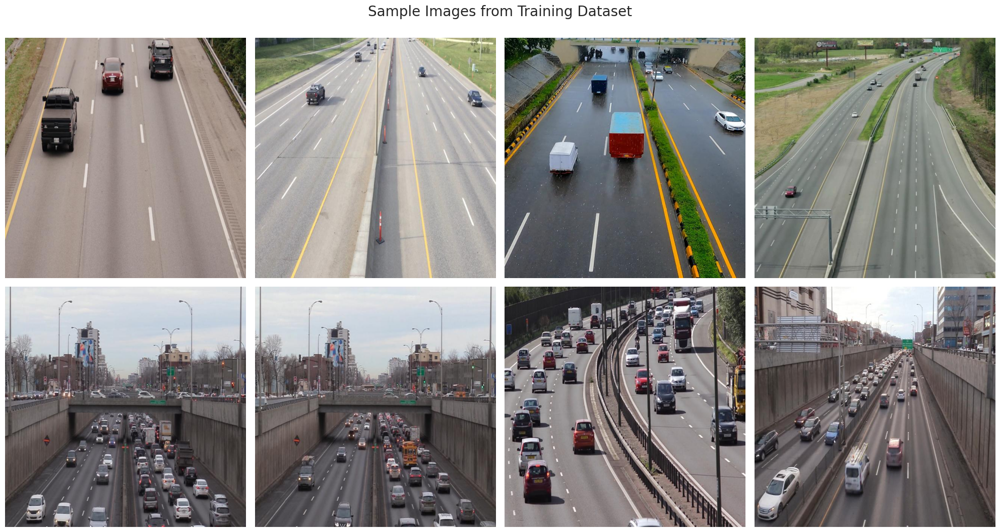

In [11]:
# List all jpg images in the directory
image_files = [file for file in os.listdir(train_images_path) if file.endswith('.jpg')]

# Select 8 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 8)]

# Create a 2x4 subplot
fig, axes = plt.subplots(2, 4, figsize=(20, 11))

# Display each of the selected images
for ax, img_file in zip(axes.ravel(), selected_images):
    img_path = os.path.join(train_images_path, img_file)
    image = Image.open(img_path)
    ax.imshow(image)
    ax.axis('off')

plt.suptitle('Sample Images from Training Dataset', fontsize=20)
plt.tight_layout()
plt.show()

<a id="Fine_Tuning_YOLOv8"></a>
# <p style="background-color: #141140; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Step 4 | Fine-Tuning YOLOv8 </p>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">In this step of our project, we're set to fine-tune our YOLOv8 pre-trained object detection model using transfer learning, specifically tailoring it to our 'Top-View Vehicle Detection Image Dataset'. By leveraging the YOLOv8 model's existing weights from its training on the comprehensive COCO dataset, we start from a robust foundation rather than from scratch. This approach not only saves significant time and resources but also capitalizes on our focused dataset to enhance the model's ability to accurately recognize and detect vehicles in top-view images. This method of training enables efficient and effective model adaptation, ensuring it's finely attuned to the specificities of vehicle detection from aerial perspectives:</p>
</div>

In [12]:
# Train the model on our custom dataset
results = model.train(
    data=yaml_file_path,     # Path to the dataset configuration file
    epochs=1,              # Number of epochs to train for
    imgsz=640,               # Size of input images as integer
    device='cpu',            # Device to run on, i.e. cuda device=0
    patience=50,             # Epochs to wait for no observable improvement for early stopping of training
    batch=32,                # Number of images per batch
    optimizer='auto',        # Optimizer to use, choices=[SGD, Adam, Adamax, AdamW, NAdam, RAdam, RMSProp, auto]
    lr0=0.0001,              # Initial learning rate
    lrf=0.1,                 # Final learning rate (lr0 * lrf)
    dropout=0.1,             # Use dropout regularization
    seed=0                   # Random seed for reproducibility
)

Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CPU (Intel Xeon CPU @ 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.1, dynamic=False, embed=None, epochs=1, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.1, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=aut

<a id="Model_Performance_Evaluation"></a>
# <p style="background-color: #141140; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Step 5 | Model Performance Evaluation </p>
⬆️ [Tabel of Contents](#contents_tabel)

In [16]:
# Define the path to the directory
post_training_files_path = '/content/runs/detect/train2'

# List the files in the directory
!ls {post_training_files_path}

args.yaml			 confusion_matrix.png  train_batch2.jpg
BoxF1_curve.png			 labels.jpg	       val_batch0_labels.jpg
BoxP_curve.png			 results.csv	       val_batch0_pred.jpg
BoxPR_curve.png			 results.png	       val_batch1_labels.jpg
BoxR_curve.png			 train_batch0.jpg      val_batch1_pred.jpg
confusion_matrix_normalized.png  train_batch1.jpg      weights


<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <h2 style="font-size:22px; font-family:calibri; color:#141140;"><b>📁 Training Output Files Explained</b></h2>
    <p style="font-size:18px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        Here’s a rundown of each item:
    </p>
    <ul style="font-size:18px; font-family:calibri; line-height: 1.5em;">
        <li><b>Weights Folder:</b> Contains the 'best.pt' and 'last.pt' files, which are the best and most recent weights of our trained model respectively.</li>
        <li><b>Args:</b> A file that stores the arguments or parameters that were used during the training process.</li>
        <li><b>Confusion Matrix:</b> Visual representations of the model performance. One is normalized, which helps in understanding the true positive rate across classes.</li>
        <li><b>Events File:</b> Contains logs of events that occurred during training, useful for debugging and analysis.</li>
        <li><b>F1 Curve:</b> Illustrates the F1 score of the model over time, balancing precision and recall.</li>
        <li><b>Labels:</b> Shows the distribution of different classes within the dataset and their correlation.</li>
        <li><b>P Curve, PR Curve, R Curve:</b> These are Precision, Precision-Recall, and Recall curves, respectively, providing insights into the trade-offs between different metrics at various thresholds.</li>
        <li><b>results:</b> This csv file captures a comprehensive set of performance metrics recorded at each epoch during the model's training process.</li>
        <li><b>Train Batch Images:</b> Sample images from the training set with model predictions overlaid, useful for a quick visual check of model performance.</li>
        <li><b>Validation Batch Images:</b> Similar to train batch images, these are from the validation set and include both labels and predictions, providing a glimpse into how well the model generalizes.</li>
    </ul>
</div>


<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <p style="font-size:18px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        I will undertake a comprehensive evaluation and analysis of our model's performance, which involves:
    </p>
    <ul style="font-size:18px; font-family:calibri; line-height: 1.5em;">
        <li><b>Learning Curves Analysis</b></li>
        <li><b>Confusion Matrix Evaluation</b></li>
        <li><b>Performance Metrics Assessment</b></li>
    </ul>
</div>


<a id="Learning_Curves"></a>
# <b><span style='color:#b2addb'>Step 5.1 |</span><span style='color:#141140'> Learning Curves Analysis</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">In this step, let's review the training and validation loss trends over epochs to assess the learning stability and efficiency:</p>
</div>

In [14]:
# Define a function to plot learning curves for loss values
def plot_learning_curve(df, train_loss_col, val_loss_col, title):
    plt.figure(figsize=(12, 5))
    sns.lineplot(data=df, x='epoch', y=train_loss_col, label='Train Loss', color='#141140', linestyle='-', linewidth=2)
    sns.lineplot(data=df, x='epoch', y=val_loss_col, label='Validation Loss', color='orangered', linestyle='--', linewidth=2)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

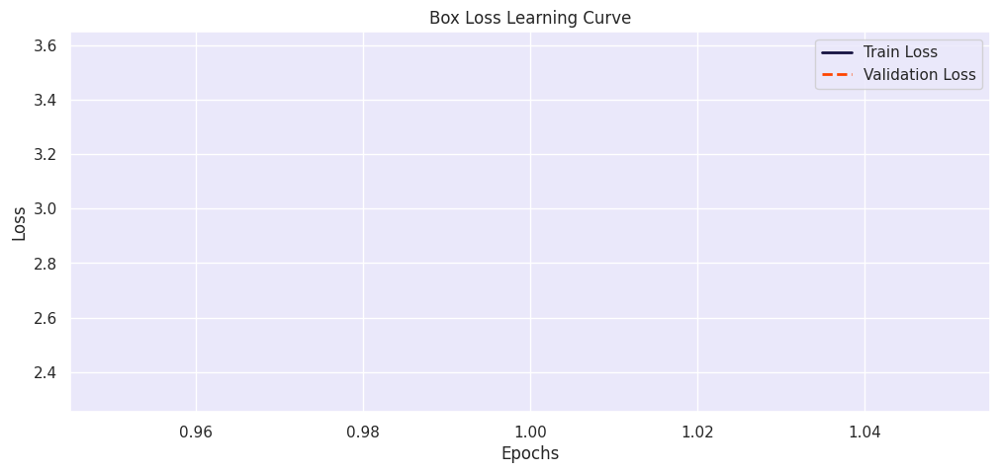

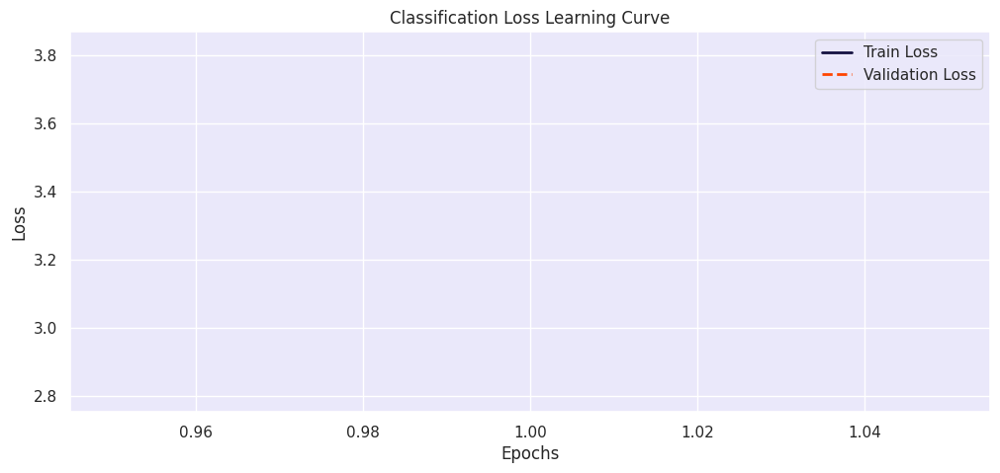

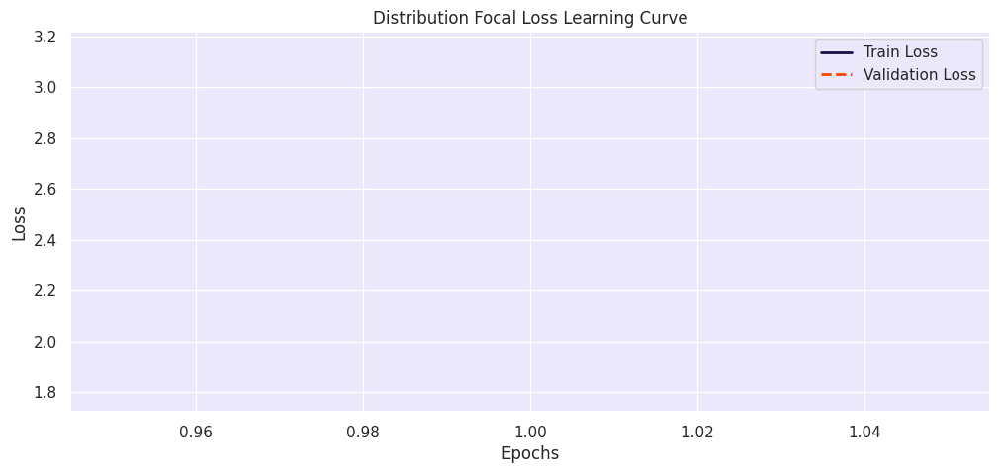

In [17]:
# Create the full file path for 'results.csv' using the directory path and file name
results_csv_path = os.path.join(post_training_files_path, 'results.csv')

# Load the CSV file from the constructed path into a pandas DataFrame
df = pd.read_csv(results_csv_path)

# Remove any leading whitespace from the column names
df.columns = df.columns.str.strip()

# Plot the learning curves for each loss
plot_learning_curve(df, 'train/box_loss', 'val/box_loss', 'Box Loss Learning Curve')
plot_learning_curve(df, 'train/cls_loss', 'val/cls_loss', 'Classification Loss Learning Curve')
plot_learning_curve(df, 'train/dfl_loss', 'val/dfl_loss', 'Distribution Focal Loss Learning Curve')

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <h2 style="font-size:22px; font-family:calibri; color:#141140;"><b>📈 Model Learning Curve Analysis</b></h2>
    <p style="font-size:18px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        The learning curves for box loss, classification loss, and distribution focal loss indicate a rapid decrease in loss values during the initial epochs, leveling off as training progresses. This trend, along with the close alignment of training and validation loss lines, suggests that the model is learning effectively without overfitting, meaning it is well-tuned to the dataset without being biased or too variable.
    </p>
    <p style="font-size:18px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        The smoothness of the learning curves, especially evident in the latter epochs, implies that the model is reaching a state of equilibrium, where additional training does not significantly enhance performance. This observation suggests that 100 epochs are sufficient for training this model, as further training is unlikely to result in substantial gains.
</div>

<a id="Confusion_Matrix"></a>
# <b><span style='color:#b2addb'>Step 5.2 |</span><span style='color:#141140'> Confusion Matrix Evaluation</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <p style="font-size:18px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        Next, I will focus on displaying and meticulously analyzing the confusion matrix derived from our model's performance on the validation dataset:
    </p>
</div>

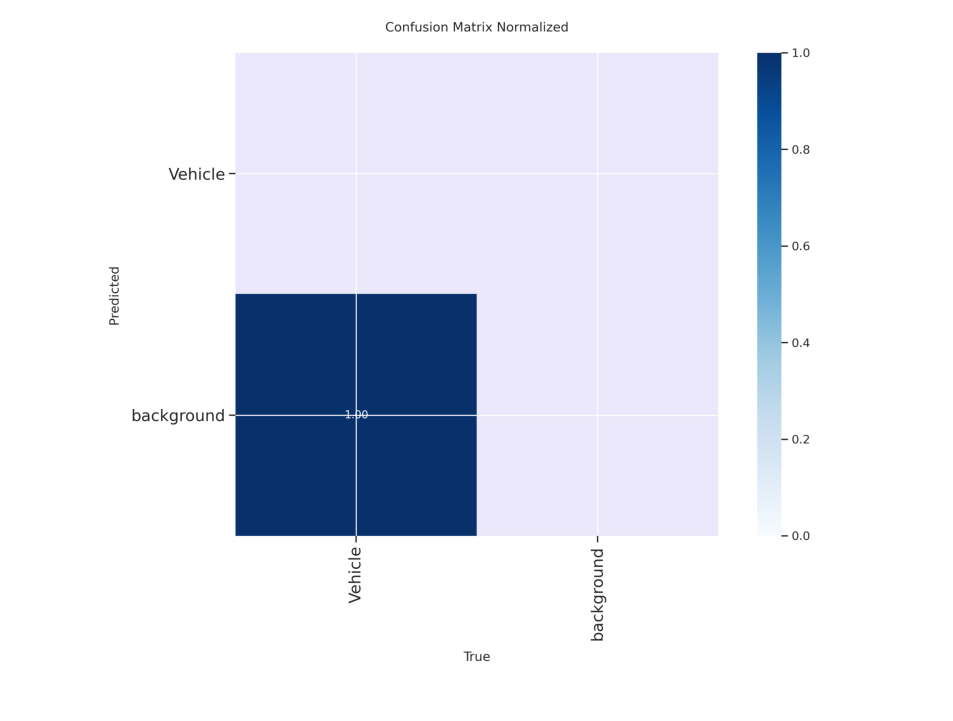

In [18]:
# Construct the path to the normalized confusion matrix image
confusion_matrix_path = os.path.join(post_training_files_path, 'confusion_matrix_normalized.png')

# Read the image using cv2
cm_img = cv2.imread(confusion_matrix_path)

# Convert the image from BGR to RGB color space for accurate color representation with matplotlib
cm_img = cv2.cvtColor(cm_img, cv2.COLOR_BGR2RGB)

# Display the image
plt.figure(figsize=(10, 10), dpi=120)
plt.imshow(cm_img)
plt.axis('off')
plt.show()

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <h2 style="font-size:22px; font-family:calibri; color:#141140;"><b>🔍 Confusion Matrix Analysis</b></h2>
    <p style="font-size:18px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        The confusion matrix for our YOLOv8 vehicle detection model illustrates high accuracy as mentioned earlier as well. In 97% of instances, the model successfully identifies the presence of a vehicle when there is one, indicating strong detection capability. Conversely, in just 3% of cases, the model fails to detect a vehicle that is actually present, suggesting room for improvement in reducing false negatives.
    </p>
</div>


<a id="Performance_Metrics"></a>
# <b><span style='color:#b2addb'>Step 5.3 |</span><span style='color:#141140'> Performance Metrics Assessment</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">Finally, I am delving into various metrics to understand the model's predictive accuracy and areas of potential improvement:</p>
</div>

In [19]:
# Construct the path to the best model weights file using os.path.join
best_model_path = os.path.join(post_training_files_path, 'weights/best.pt')

# Load the best model weights into the YOLO model
best_model = YOLO(best_model_path)

# Validate the best model using the validation set with default parameters
metrics = best_model.val(split='val')

Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CPU (Intel Xeon CPU @ 2.20GHz)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.7±0.4 ms, read: 104.9±20.9 MB/s, size: 63.2 KB)
val: Scanning /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/valid/labels... 90 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 90/90 398.5it/s 0.2s
WARNING ⚠️ val: Cache directory /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/valid is not writable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 6/6 3.8s/it 22.9s
                   all         90        937    0.00211     0.0608     0.0012   0.000316
Speed: 2.2ms preprocess, 226.9ms inference, 0.0ms loss, 12.8ms postprocess per image
Results saved to /content/runs/detect/val


as can be seen in the above verbose

In [20]:
# Convert the dictionary to a pandas DataFrame and use the keys as the index
metrics_df = pd.DataFrame.from_dict(metrics.results_dict, orient='index', columns=['Metric Value'])

# Display the DataFrame
metrics_df.round(3)

,Metric Value
metrics/precision(B),0.002
metrics/recall(B),0.061
metrics/mAP50(B),0.001
metrics/mAP50-95(B),0.000
fitness,0.000


<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px rgba(0, 0, 0, 0.1);">
    <h1 style="font-size:24px; font-family:calibri; color:#141140;"><b>🔍 Model Evaluation Insights</b></h1>
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em;">
        The YOLOv8 model shows impressive results on the validation set. With a precision of <b>91.6%</b>, it indicates that the majority of the predictions made by the model are correct. The recall score of <b>93.8%</b> demonstrates the model's ability to find most of the relevant cases in the dataset. The model's mean Average Precision (mAP) at 50% Intersection over Union (IoU) is <b>97.5%</b>, reflecting high accuracy in detecting objects with a considerable overlap with the ground truth. Even when the IoU threshold range is expanded from 50% to 95%, the model maintains a solid mAP of <b>74.2%</b>. Finally, the fitness score of <b>76.5%</b> indicates a good balance between precision, recall, and the IoU of the predictions, confirming the model's effectiveness in object detection tasks.
    </p>
</div>


<a id="Model_Inference"></a>
# <p style="background-color: #141140; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Step 6 | Model Inference & Generalization Assessment </p>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        To thoroughly assess our model's capability to generalize, I will conduct inferences in three distinct steps:
    </p>
    <ul style="font-size:20px; font-family:calibri; line-height: 1.5em;">
        <li><b>Inference on Validation Set Images</b></li>
        <li><b>Inference on an Unseen Test Image</b></li>
        <li><b>Inference on an Unseen Test Video</b></li>
    </ul>
</div>


<a id="Inference_Validation"></a>
# <b><span style='color:#b2addb'>Step 6.1 |</span><span style='color:#141140'> Inference on Validation Set Images</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;"> First of all, I am going to evaluate model predictions on random images from the validation dataset:</p>
</div>


image 1/1 /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/valid/images/6_mp4-0_jpg.rf.9a055d040151678e04cb48a8bde76f55.jpg: 640x640 (no detections), 332.6ms
Speed: 4.1ms preprocess, 332.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/valid/images/4_mp4-7_jpg.rf.439bc6176789cd7ca6bd686e23fc5ddf.jpg: 640x640 (no detections), 279.7ms
Speed: 3.1ms preprocess, 279.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/valid/images/6_mp4-14_jpg.rf.a5099c3eeb2c707a2193c0efa467bb2a.jpg: 640x640 (no detections), 268.5ms
Speed: 3.0ms preprocess, 268.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/valid/images/11_

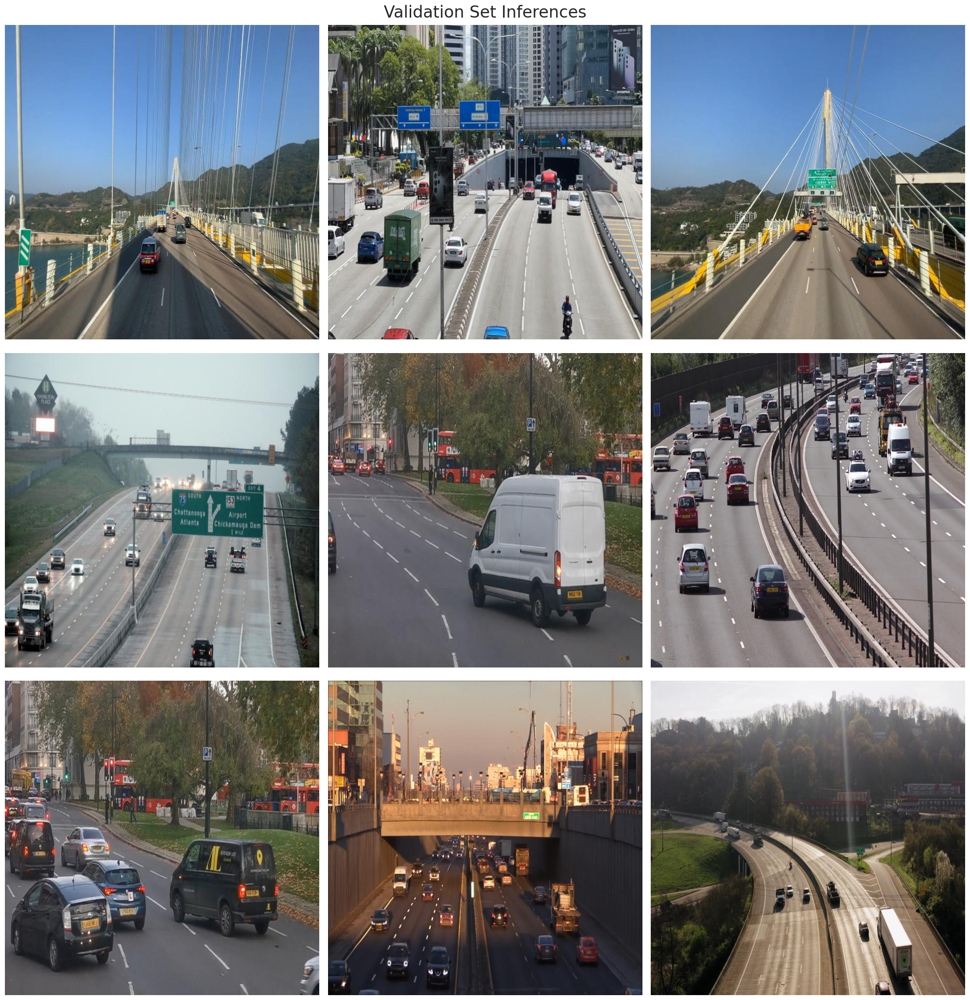

In [21]:
# Define the path to the validation images
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# List all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Select 9 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 9)]

# Initialize the subplot
fig, axes = plt.subplots(3, 3, figsize=(20, 21))
fig.suptitle('Validation Set Inferences', fontsize=24)

# Perform inference on each selected image and display it
for i, ax in enumerate(axes.flatten()):
    image_path = os.path.join(valid_images_path, selected_images[i])
    results = best_model.predict(source=image_path, imgsz=640, conf=0.5)
    annotated_image = results[0].plot(line_width=1)
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    ax.imshow(annotated_image_rgb)
    ax.axis('off')

plt.tight_layout()
plt.show()

<a id="Inference_Test_Image"></a>
# <b><span style='color:#b2addb'>Step 6.2 |</span><span style='color:#141140'> Inference on an Unseen Test Image</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        Now, I will employ the best version of our fine-tuned model to evaluate its generalization capabilities. I'll test it on the same image previously analyzed using the pre-trained YOLOv8 model on the COCO dataset:
    </p>
</div>


image 1/1 /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/sample_image.jpg: 384x640 (no detections), 112.5ms
Speed: 5.8ms preprocess, 112.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


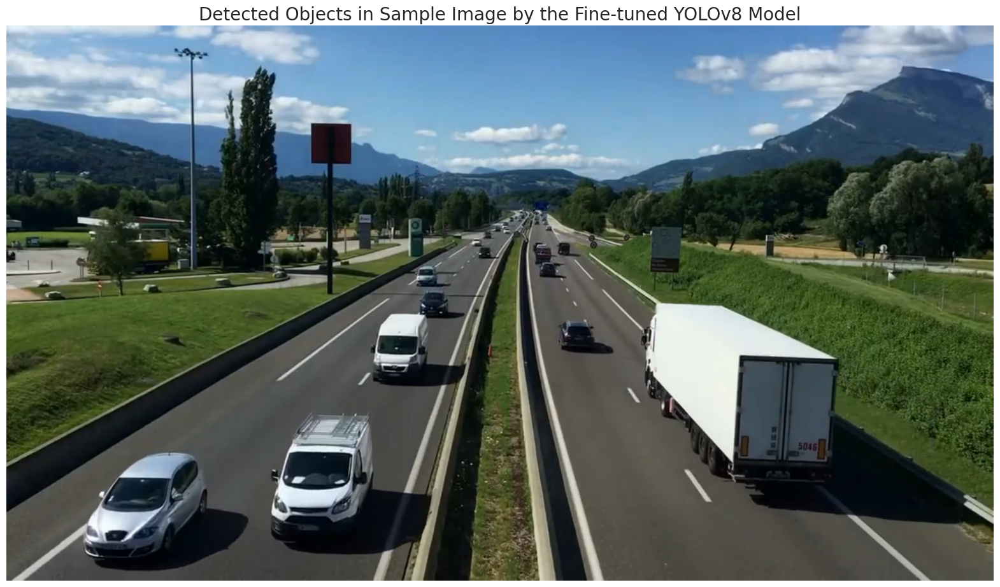

In [22]:
# Path to the image file
sample_image_path = '/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/sample_image.jpg'

# Perform inference on the provided image using best model
results = best_model.predict(source=sample_image_path, imgsz=640, conf=0.7)

# Annotate and convert image to numpy array
sample_image = results[0].plot(line_width=2)

# Convert the color of the image from BGR to RGB for correct color representation in matplotlib
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

# Display annotated image
plt.figure(figsize=(20,15))
plt.imshow(sample_image)
plt.title('Detected Objects in Sample Image by the Fine-tuned YOLOv8 Model', fontsize=20)
plt.axis('off')
plt.show()

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <h2 style="font-size:22px; font-family:calibri; color:#141140;"><b>🚗 Enhanced Vehicle Detection with Fine-Tuning</b></h2>
    <p style="font-size:18px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        The comparison between the above image with the image we had in step 2 clearly demonstrates the benefits of fine-tuning the YOLOv8 model for a specialized task. In the image from step 2, the pre-trained model on the COCO dataset missed detecting a truck and misclassified it, indicating limitations when dealing with a specific class of objects due to its broader training scope. In contrast, the above image shows that the fine-tuned model on a vehicle-specific dataset has accurately detected and classified various vehicles, including the previously missed truck. This improvement highlights the model's enhanced capability to discern features specific to vehicles, leading to better precision and recall in vehicle detection.
    </p>
</div>


<a id="Inference_Test_Video"></a>
# <b><span style='color:#b2addb'>Step 6.3 |</span><span style='color:#141140'> Inference on an Unseen Test Video</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        Finally, I am going to assess the model's generalization capabilities on a completely new video, unseen during training. This step is crucial to demonstrate the model's ability to adapt and perform accurately in real-world applications, further solidifying its effectiveness outside of the controlled dataset environment:
    </p>
</div>

In [32]:
# Define the path to the sample video in the dataset
dataset_video_path = os.path.join(farzadnekouei_top_view_vehicle_detection_image_dataset_path, 'Vehicle_Detection_Image_Dataset', 'sample_video.mp4')

# Define the destination path in the working directory
video_path = '/kaggle/working/sample_video.mp4'

# Ensure the destination directory exists before copying
os.makedirs(os.path.dirname(video_path), exist_ok=True)

# Copy the video file from its original location in the dataset to the current working directory in Kaggle for further processing
shutil.copyfile(dataset_video_path, video_path)

# Initiate vehicle detection on the sample video using the best performing model and save the output
best_model.predict(source=video_path, save=True)


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/601) /kaggle/working/sample_video.mp4: 384x640 (no detections), 133.0ms
video 1/1 (frame 2/601) /kaggle/working/sample_video.mp4: 384x640 (no detections), 119.9ms
video 1/1 (frame 3/601) /kaggle/working/sample_video.mp4: 384x640 (no detections), 120.2ms
video 1/1 (frame 4/601) /kaggle/working/sample_video.mp4: 384x640 (no detections), 122.6ms
video 1/1 (frame 5/601) /kaggle/working/sample_video.mp4: 384x640 (no detections), 135.3ms
v

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Vehicle'}
 obb: None
 orig_img: array([[[252, 245, 242],
         [252, 245, 242],
         [252, 245, 242],
         ...,
         [210, 184, 166],
         [210, 184, 166],
         [210, 184, 166]],
 
        [[252, 245, 242],
         [252, 245, 242],
         [252, 245, 242],
         ...,
         [210, 184, 166],
         [210, 184, 166],
         [210, 184, 166]],
 
        [[254, 246, 241],
         [254, 246, 241],
         [254, 246, 241],
         ...,
         [210, 184, 166],
         [210, 184, 166],
         [210, 184, 166]],
 
        ...,
 
        [[ 94, 104, 103],
         [ 96, 106, 105],
         [101, 111, 110],
         ...,
         [ 94, 106, 111],
         [ 95, 107, 112],
         [ 97, 109, 114]],
 
        [[ 98, 108, 107],
         [103, 113, 112],
         [100, 110, 109],
         ...,
         [ 95, 10

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        To ensure compatibility with various platforms, including Jupyter Notebooks, we'll convert the output <code>.avi</code> video file to the more universally supported <code>.mp4</code> format and then display it within the notebook environment:
    </p>
</div>

In [29]:
# Convert the .avi video generated by the YOLOv8 prediction to .mp4 format for compatibility with notebook display
!ffmpeg -y -loglevel panic -i /kaggle/working/runs/detect/predict/sample_video.avi processed_sample_video.mp4

# Embed and display the processed sample video within the notebook
Video("processed_sample_video.mp4", embed=True, width=960)

<a id="Traffic_Intensity_Estimation"></a>
# <p style="background-color: #141140; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Step 7 | Real-Time Traffic Intensity Estimation </p>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        As we transition into the practical application step of our project, we are set to deploy our finely-tuned vehicle detection model to analyze traffic density. This step is crucial in demonstrating the model's ability to generalize and perform accurately on unseen videos—videos that were not part of the model's training or validation sets.
    </p>
    <p style="font-size:18px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
Our objective is to quantify the traffic by counting vehicles within specified areas on the road lanes, frame by frame. The analysis will not only reveal the vehicle count but also gauge the intensity of traffic, labeling it as 'Heavy' or 'Smooth' based on a predetermined threshold. The count and traffic flow insights are pivotal for urban planning and traffic management.
    </p>
    <p style="font-size:18px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
While real-time processing on Kaggle is not viable, the code below simulates this process by modifying video frames, applying vehicle detection, and annotating the results. This mimics real-time analysis which can be achieved on local machines—even on CPUs—by processing webcam feeds or video files in real-time. The annotated video is then saved, ready to be reviewed for traffic assessment.
    </p>
    <p style="font-size:18px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
Let's delve into the code that brings this all to life:
</div>

In [27]:
# Define the threshold for considering traffic as heavy
heavy_traffic_threshold = 10

# Define the vertices for the quadrilaterals
vertices1 = np.array([(465, 350), (609, 350), (510, 630), (2, 630)], dtype=np.int32)
vertices2 = np.array([(678, 350), (815, 350), (1203, 630), (743, 630)], dtype=np.int32)

# Define the vertical range for the slice and lane threshold
x1, x2 = 325, 635
lane_threshold = 609

# Define the positions for the text annotations on the image
text_position_left_lane = (10, 50)
text_position_right_lane = (820, 50)
intensity_position_left_lane = (10, 100)
intensity_position_right_lane = (820, 100)

# Define font, scale, and colors for the annotations
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
font_color = (255, 255, 255)    # White color for text
background_color = (0, 0, 255)  # Red background for text

# Open the video
cap = cv2.VideoCapture('sample_video.mp4')

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('traffic_density_analysis.avi', fourcc, 20.0, (int(cap.get(3)), int(cap.get(4))))

# Read until video is completed
while cap.isOpened():
    # Capture frame-by-frame
    ret, frame = cap.read()
    if ret:
        # Create a copy of the original frame to modify
        detection_frame = frame.copy()

        # Black out the regions outside the specified vertical range
        detection_frame[:x1, :] = 0  # Black out from top to x1
        detection_frame[x2:, :] = 0  # Black out from x2 to the bottom of the frame

        # Perform inference on the modified frame
        results = best_model.predict(detection_frame, imgsz=640, conf=0.4)
        processed_frame = results[0].plot(line_width=1)

        # Restore the original top and bottom parts of the frame
        processed_frame[:x1, :] = frame[:x1, :].copy()
        processed_frame[x2:, :] = frame[x2:, :].copy()

        # Draw the quadrilaterals on the processed frame
        cv2.polylines(processed_frame, [vertices1], isClosed=True, color=(0, 255, 0), thickness=2)
        cv2.polylines(processed_frame, [vertices2], isClosed=True, color=(255, 0, 0), thickness=2)

        # Retrieve the bounding boxes from the results
        bounding_boxes = results[0].boxes

        # Initialize counters for vehicles in each lane
        vehicles_in_left_lane = 0
        vehicles_in_right_lane = 0

        # Loop through each bounding box to count vehicles in each lane
        for box in bounding_boxes.xyxy:
            # Check if the vehicle is in the left lane based on the x-coordinate of the bounding box
            if box[0] < lane_threshold:
                vehicles_in_left_lane += 1
            else:
                vehicles_in_right_lane += 1

        # Determine the traffic intensity for the left lane
        traffic_intensity_left = "Heavy" if vehicles_in_left_lane > heavy_traffic_threshold else "Smooth"
        # Determine the traffic intensity for the right lane
        traffic_intensity_right = "Heavy" if vehicles_in_right_lane > heavy_traffic_threshold else "Smooth"


        # Add a background rectangle for the left lane vehicle count
        cv2.rectangle(processed_frame, (text_position_left_lane[0]-10, text_position_left_lane[1] - 25),
                      (text_position_left_lane[0] + 460, text_position_left_lane[1] + 10), background_color, -1)

        # Add the vehicle count text on top of the rectangle for the left lane
        cv2.putText(processed_frame, f'Vehicles in Left Lane: {vehicles_in_left_lane}', text_position_left_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # Add a background rectangle for the left lane traffic intensity
        cv2.rectangle(processed_frame, (intensity_position_left_lane[0]-10, intensity_position_left_lane[1] - 25),
                      (intensity_position_left_lane[0] + 460, intensity_position_left_lane[1] + 10), background_color, -1)

        # Add the traffic intensity text on top of the rectangle for the left lane
        cv2.putText(processed_frame, f'Traffic Intensity: {traffic_intensity_left}', intensity_position_left_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # Add a background rectangle for the right lane vehicle count
        cv2.rectangle(processed_frame, (text_position_right_lane[0]-10, text_position_right_lane[1] - 25),
                      (text_position_right_lane[0] + 460, text_position_right_lane[1] + 10), background_color, -1)

        # Add the vehicle count text on top of the rectangle for the right lane
        cv2.putText(processed_frame, f'Vehicles in Right Lane: {vehicles_in_right_lane}', text_position_right_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # Add a background rectangle for the right lane traffic intensity
        cv2.rectangle(processed_frame, (intensity_position_right_lane[0]-10, intensity_position_right_lane[1] - 25),
                      (intensity_position_right_lane[0] + 460, intensity_position_right_lane[1] + 10), background_color, -1)

        # Add the traffic intensity text on top of the rectangle for the right lane
        cv2.putText(processed_frame, f'Traffic Intensity: {traffic_intensity_right}', intensity_position_right_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # Write the processed frame to the output video
        out.write(processed_frame)

        # Uncomment the following 3 lines if running this code on a local machine to view the real-time processing results
        # cv2.imshow('Real-time Analysis', processed_frame)
        # if cv2.waitKey(1) & 0xFF == ord('q'):  # Press Q on keyboard to exit the loop
        #     break
    else:
        break

# Release the video capture and video write objects
cap.release()
out.release()

# Close all the frames
# cv2.destroyAllWindows()

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        Finally, lets convert the output <code>.avi</code> video to <code>.mp4</code> format for notebook playback and display it:
    </p>
</div>

In [30]:
# Convert the .avi video generated by our traffic density estimation app to .mp4 format for compatibility with notebook display
!ffmpeg -y -loglevel panic -i /kaggle/working/traffic_density_analysis.avi traffic_density_analysis.mp4

# Embed and display the processed sample video within the notebook
Video("traffic_density_analysis.mp4", embed=True, width=960)

<a id="Model_Export"></a>
# <p style="background-color: #141140; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Step 8 | Model Export for Cross-Platform Deployment </p>
⬆️ [Tabel of Contents](#contents_tabel)

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        We're now at the final step of our project – exporting our best model for future use and deployment. Currently, our model exists in a <code>.pt</code> format, optimal for tasks such as ongoing training, additional fine-tuning, or deployment within PyTorch-compatible environments. To enhance the model's versatility and ensure it can be utilized across various platforms, we'll be exporting it in the ONNX (Open Neural Network Exchange) format. ONNX is specially designed for model portability, enabling seamless operation across different machine learning frameworks including PyTorch, TensorFlow, and Microsoft's Cognitive Toolkit (CNTK), as well as compatibility with specialized hardware accelerators. This step ensures our model's readiness for diverse deployment scenarios, aligning with the broad scope of modern AI applications. For more details on the export process and available formats, refer to <a href="https://docs.ultralytics.com/modes/export/#arguments">Ultralytics Documentation</a>.
    </p>
</div>


In [31]:
# Export the model
best_model.export(format='onnx')

Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CPU (Intel Xeon CPU @ 2.20GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/

PyTorch: starting from '/content/runs/detect/train2/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 5, 8400) (6.0 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0,<=1.19.1', 'onnxslim>=0.1.71', 'onnxruntime'] not found, attempting AutoUpdate...
Using Python 3.12.12 environment at: /usr
Resolved 14 packages in 295ms
Prepared 6 packages in 1.92s
Installed 6 packages in 1.38s
 + colorama==0.4.6
 + coloredlogs==15.0.1
 + humanfriendly==10.0
 + onnx==1.19.1
 + onnxruntime==1.24.0.dev20251031003
 + onnxslim==0.1.77

requirements: AutoUpdate success ✅ 4.3s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.19.1 opset 22...
ONNX: slimming with onnxslim 0.1.77.

'/content/runs/detect/train2/weights/best.onnx'

<div style="display: flex; align-items: center; justify-content: center; border-radius: 10px; padding: 20px; background-color: #eae8fa; font-size: 120%; text-align: center;">
    <strong>
        🌐 For comprehensive insights, extensive code, and additional resources, visit the project's
        <a href="https://github.com/FarzadNekouee/YOLOv8_Traffic_Density_Estimation/tree/master" style="color: #141140; text-decoration: none;">
            <em><u>GitHub Repository</u></em>
        </a>
        🌐
    </strong>
</div>


<h2 align="left"><font color=#141140>Best Regards</font></h2>